----

<img src="https://saudigazette.com.sa/uploads/images/2020/06/18/1584889.png" width=200>

# **Saudi Pro League**

---

# **1. Video 1 - Detecting Players and Ball**

In [ ]:
## tensorflow

In [3]:
#!git clone https://github.com/noorkhokhar99/YOLOv8-football.git
#!pip install ultralytics==8.0.0
#use https://github.com/noorkhokhar99/YOLOv8-football

In [4]:
!yolo task=detect mode=predict model=yolov8m-football.pt conf=0.25 imgsz=1280 line_thickness=1 source=1_short_ball.mp4

2023-10-09 08:20:19.980623: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-09 08:20:20.713723: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.0 🚀 Python-3.8.13 torch-2.0.1+cu117 CPU
Fusing layers... 
Model summary: 218 layers, 25842076 parameters, 0 gradients
video 1/1 (1/806) /home/datascience/1_projects/spl/1_short_ball.mp4: 736x1280 1 ball, 1 goalkeeper, 14 players, 2 referees, 557.4ms
video 1/1 (2/806) /home/datascience/1_projects/spl/1_short_ball.mp4: 736x1280 1 ball, 1 goalkeeper, 13 players, 2 referees, 536.7ms
video 1/1 (3/806) /home/datascience/1_projects/spl/1_short_ball.mp4: 736x1280 1 ball, 1 goalkeeper, 13 players, 2 referees, 503.1ms
video 1/1 (4/806) /home/datas

----

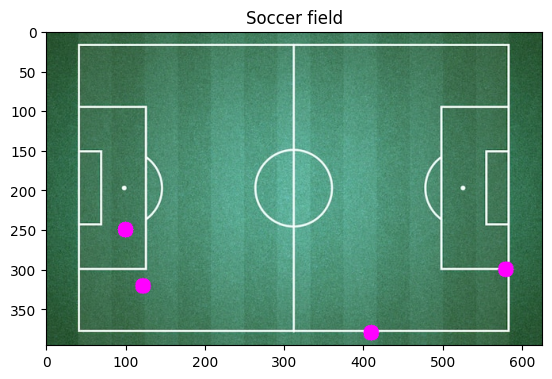

In [66]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
field_img = cv2.imread('field.png')

plt.title('Soccer field') 

circles2 = np.array([
        [100, 250], # Upper left
        [580, 300], # Upper right
        [410, 380], # Lower left
        [122, 321], # Lower right
        ], np.float32)

for i in circles2:
    x, y = i
    field_img = cv2.circle(field_img, (int(x),int(y)), radius=10, color=(300, 0, 255), thickness=-1)

plt.imshow(field_img)
plt.show()

---

# **2. Video 2 - Detecting Players and Ball**

In [ ]:
import oci
import torch

from oci.ai_vision import AIServiceVisionClient
from oci.ai_vision.models import AnalyzeImageDetails
from oci.ai_vision.models import ImageClassificationFeature
from oci.ai_vision.models import ImageObjectDetectionFeature
from oci.ai_vision.models import InlineImageDetails
from oci.ai_vision.models import ObjectStorageImageDetails

import os
import base64
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import glob
from tqdm import tqdm
import seaborn as sns

from IPython.display import Video

## **Split video in frames**

In [31]:
# have a look at the Video
VIDEO_FILE = "./1_short_ball.mp4"

Video(VIDEO_FILE, embed=True)

In [34]:
# Read the video from specified path 
cam = cv2.VideoCapture(VIDEO_FILE)

# get fps
fps = int(cam.get(cv2.CAP_PROP_FPS))

# get the total number of frames
tot_frames = int(cam.get(cv2.CAP_PROP_FRAME_COUNT))
duration = round(tot_frames/fps, 1)
print(f"Total duration {duration} sec.")
print(f"frames per second: {fps}")
print(f"number of frames: {tot_frames}")

Total duration 26.9 sec.
frames per second: 30
number of frames: 806


In [35]:
%%time 

path_split_images = "./split_images" 

if not os.path.exists(path_split_images):         
    os.makedirs(path_split_images) 
        
# Read the video from specified path 
cam = cv2.VideoCapture(VIDEO_FILE)

# get fps
fps = int(cam.get(cv2.CAP_PROP_FPS))

# get the total number of frames
tot_frames = int(cam.get(cv2.CAP_PROP_FRAME_COUNT))

n_frames = 0

ret, frame = cam.read() 

with tqdm(total=tot_frames, colour="blue") as pbar:
    while(ret): 
        n_frames += 1
    
        # build the file name
        f_name = "img{:05d}.jpg".format(n_frames)
    
        cv2.imwrite("./split_images" + "/" + f_name, frame)
        
        pbar.update(1)
        
        # reading next frame 
        ret, frame = cam.read() 
    
cam.release() 
cv2.destroyAllWindows()

print()
print(f"Total number of frames: {n_frames}")

100%|██████████| 806/806 [00:07<00:00, 113.25it/s]


Total number of frames: 806
CPU times: user 8.77 s, sys: 0 ns, total: 8.77 s
Wall time: 7.14 s


In [40]:
#!zip -r splitimages.zip /home/datascience/1_projects/spl/split_images

## **Invoke OCI AI Vision model**

In [46]:
# legge le api key e la configurazione per invocare il Language Service
config = oci.config.from_file()

# Max Result to return
MAX_RESULTS = 4

# logos for which I want to analyze
logos_list = ['kafd', 'qiddiya', 'rsl', 'roshin']

# color map for logos
label_map = {}
# the label returned from OCI Visio is Mobil1 and not Mobil
label_map["kafd"] = [169, 23, 69] # blue
label_map["qiddiya"] = [64, 57, 144] # red [169, 23, 69]
label_map["rsl"] = [112, 168, 162] # green
label_map["roshin"] = [45, 168, 162] # xx

# Vision Service endpoint
ENDPOINT = "https://vision.aiservice.eu-frankfurt-1.oci.oraclecloud.com"
# the custom trained model we're using for Object Detection
MODEL_ID = "ocid1.aivisionmodel.oc1.eu-frankfurt-1.amaaaaaangencdyau342b6dpvpdvsqk7lle56xt2htiua4zolfauvjtsgubq"

ai_service_vision_client = AIServiceVisionClient(config=config, service_endpoint=ENDPOINT)

## **Function**

In [47]:
def analyze_single_image(f_name):
    #
    # as input the file name
    #
    with open(f_name, "rb") as image_file:
        # we need to send as base64, UTF8
        encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
    
    image_object_detection_feature = ImageObjectDetectionFeature()
    image_object_detection_feature.max_results = MAX_RESULTS

    # this is the ID of our custom model
    image_object_detection_feature.model_id = MODEL_ID

    # List of Features
    features = [image_object_detection_feature]

    # Create Analyze Image Object and set Image and Features
    analyze_image_details = AnalyzeImageDetails()
    inline_image_details = InlineImageDetails()

    inline_image_details.data = encoded_string
    analyze_image_details.image = inline_image_details
    analyze_image_details.features = features

    # Send analyze image request to Vision Service
    res = ai_service_vision_client.analyze_image(analyze_image_details=analyze_image_details)
    
    # transform in JSON
    od_results = json.loads(str(res.data))
    
    od_bounding_boxes = od_results['image_objects']
    
    list_logos = []
    
    if od_bounding_boxes is not None:
        for box in od_bounding_boxes:
            list_logos.append(box['name'])
    else:
        list_logos.append("")
        
    # to sort and remove duplicates
    list_logos = sorted(list(set(list_logos)))
    
    return list_logos


## **Invoke model**

In [48]:
file_names_list = sorted(glob.glob("./split_images/*.jpg"))

all_logos_list = []

for f_name in file_names_list:
    logo_list = analyze_single_image(f_name)
    
    logo_str = ','.join([str(item) for item in logo_list])
    all_logos_list.append(logo_str)

#
# create and shows the results dataframe
#
df_dict = {"fname": file_names_list, "logos": all_logos_list}
df = pd.DataFrame(df_dict)

print()
print(f"Analyzed {len(file_names_list)} images. The result is:")
print()
display(df)


Analyzed 806 images. The result is:



,fname,logos
0,./split_images/img00001.jpg,"roshin,rsl"
1,./split_images/img00002.jpg,"roshin,rsl"
2,./split_images/img00003.jpg,"roshin,rsl"
3,./split_images/img00004.jpg,"roshin,rsl"
4,./split_images/img00005.jpg,"roshin,rsl"
...,...,...
801,./split_images/img00802.jpg,"kafd,rsl"
802,./split_images/img00803.jpg,"kafd,rsl"
803,./split_images/img00804.jpg,"kafd,rsl"
804,./split_images/img00805.jpg,"kafd,rsl"


## **Fraction in screen**

In [51]:
LOGO = "kafd"

def logos_contains(txt):
    v_rit = False
    if LOGO in txt:
        v_rit = True
    
    return v_rit

In [53]:
all_logos_list = logos_list.copy()

for LOGO in logos_list:
    df[LOGO] = df['logos'].apply(logos_contains)
    
tot_frames = df.shape[0]

frac_list = []

for LOGO in logos_list:
    tot_containing = df[LOGO].sum()
    frac = round(float(tot_containing)*100./float(tot_frames), 1)

    # print(f"The fraction of video containing the logo {LOGO} is: {frac}%")
    frac_list.append(frac)

# add the last part
tot_found = sum(frac_list)
#all_logos_list.append("Others")
#frac_list.append(100. - tot_found)

df_dict_frac = {"logo":all_logos_list, "fraction %": frac_list}

df_frac = pd.DataFrame(df_dict_frac, index=all_logos_list)

df_frac.head()

,logo,fraction %
kafd,kafd,54.5
qiddiya,qiddiya,5.3
rsl,rsl,100.0
roshin,roshin,38.6


ValueError: num must be 1 <= num <= 3, not 4

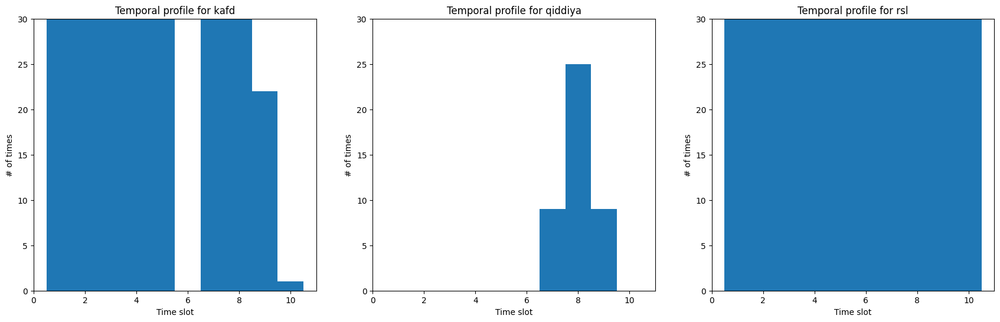

In [58]:
N_ROWS = 1
N_COLS = 3

def compute_temporal_profile(df, logo):
    # split the DataFrame in 10 buckets and compute how many times
    # the logo is present in each buckets
    N_BUCKETS = 10
    
    n_el = df.shape[0]
    w_size = int(n_el/N_BUCKETS)
    
    l_counts = []
    
    for b_num in range(N_BUCKETS):
        w_start = b_num * w_size
        w_end = w_start + w_size
        
        # handle last window
        if (w_end > n_el):
            w_end = n_el
        
        n_counts = sum(df[logo][w_start:w_end])
        
        l_counts.append(n_counts)
        
    return l_counts

plt.figure(figsize=(21, 6))

def plot_profile(profile, logo):
    plt.title("Temporal profile for " + logo)
    plt.xlabel("Time slot")
    plt.ylabel("# of times")
    plt.ylim([0, 30])
    plt.bar(x=range(1, len(profile)+1), height=profile, align='center', width=1)

for i, logo in enumerate(logos_list):
    profile = compute_temporal_profile(df, logo)
    plt.subplot(N_ROWS, N_COLS, i+1)
    plot_profile(profile, logo)
    
plt.show()

## **Create new video**

In [60]:
def add_bb_single_image(f_name):
    # threshold for confidence
    THRESHOLD = 0.6
    #
    # as input the file name
    #
    with open(f_name, "rb") as image_file:
        # we need to send as base64, UTF8
        encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
    
    image_object_detection_feature = ImageObjectDetectionFeature()
    image_object_detection_feature.max_results = MAX_RESULTS

    # this is the ID of our custom model
    image_object_detection_feature.model_id = MODEL_ID

    # List of Features
    features = [image_object_detection_feature]

    # Create Analyze Image Object and set Image and Features
    analyze_image_details = AnalyzeImageDetails()
    inline_image_details = InlineImageDetails()

    inline_image_details.data = encoded_string
    analyze_image_details.image = inline_image_details
    analyze_image_details.features = features

    # Send analyze image request to Vision Service
    res = ai_service_vision_client.analyze_image(analyze_image_details=analyze_image_details)
    
    od_results = json.loads(str(res.data))
    
    od_bounding_boxes = od_results['image_objects']
    
    # get the BB
    im = cv2.imread(f_name)

    # Get Dimensions of Image
    height, width, channels = im.shape
    
    if od_bounding_boxes is not None:
    # Iterate over each Bounding Box
        for box in od_bounding_boxes:
            if box['confidence'] >= THRESHOLD:
                # draw
                # Extract opposite coordinates for bounding box
                # Un-Normalise the Data by scaling to the max image height and width
                # Convert to Integer
                coordinates_pt1_x = int(box['bounding_polygon']['normalized_vertices'][0]['x'] * width)
                coordinates_pt1_y = int(box['bounding_polygon']['normalized_vertices'][0]['y'] * height)
                coordinates_pt2_x = int(box['bounding_polygon']['normalized_vertices'][2]['x'] * width)
                coordinates_pt2_y = int(box['bounding_polygon']['normalized_vertices'][2]['y'] * height)
    
                # Build Points as Tuples
                coordinates_pt1 = (coordinates_pt1_x, coordinates_pt1_y)
                coordinates_pt2 = (coordinates_pt2_x, coordinates_pt2_y)
    
                # Draw Bounding Boxes - Pass in Image, Top Left and Bottom Right Points, Colour, Line Thickness
                cv2.rectangle(im, coordinates_pt1, coordinates_pt2, label_map[box['name']], 2)
                # Plot Label just above the Top Left Point, Set Font, Size, Colour, Thickness
                cv2.putText(im, box['name'], (coordinates_pt1_x, coordinates_pt1_y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,0), 2)
    
    # return the image with all BBs added
    return im

In [61]:
# in this dir we will put all images with BB
path_split_images_bb = "./split_images_bb"

if not os.path.exists(path_split_images_bb):         
    os.makedirs(path_split_images_bb)

In [62]:
file_names_list = sorted(glob.glob("./split_images/*.jpg"))

with tqdm(total=len(file_names_list), colour="blue") as pbar:
    for f_name in file_names_list:
        # call API
        im_with_bb = add_bb_single_image(f_name)
        
        new_name = f_name.split("/")[-1].split(".")[0] + "_bb.jpg"
        
        cv2.imwrite("./split_images_bb" + "/" + new_name, im_with_bb)
        
        pbar.update(1)

100%|██████████| 806/806 [04:33<00:00,  2.94it/s]


In [65]:
%%time

image_folder = "./split_images_bb"
video_name = './spl-video-output.mp4'

# Create list of image file names
images = [img for img in os.listdir(image_folder) if img.endswith(".jpg")]
images.sort()

# Take a sample image to extrcat frame dimensions
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

# Create a Video Writer Object:
# The first parameter is the filename, followed by an integer (fourcc in the documentation, the codec used), 
# the FPS count and a tuple of the dimensions of the frame
video = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*'MP4V'), 24, (width,height))

# Write Images to File
for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

# Destroy Objects
#cv2.destroyAllWindows()
video.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


CPU times: user 5.85 s, sys: 37.8 ms, total: 5.89 s
Wall time: 5.89 s
